In [1]:
import pandas as pd
import pandas_datareader as pdr
import yfinance as yf
yf.pdr_override()
from datetime import datetime
import plotly.express as px
from scipy import stats
import matplotlib.pyplot as plt
import numpy as np
import plotly.figure_factory as ff
import plotly.graph_objects as go
pd.pandas.set_option('display.max_columns',None)
import seaborn as sns
from pandas_datareader.data import DataReader
import seaborn as sns

C:\Users\HI\AppData\Roaming\Python\Python38\site-packages\requests\__init__.py:89: RequestsDependencyWarning: urllib3 (1.26.4) or chardet (4.0.0) doesn't match a supported version!
  warnings.warn("urllib3 ({}) or chardet ({}) doesn't match a supported "


In [2]:
stock = 'INFY'
start = datetime(2014,1,1)
df = pdr.DataReader(stock,data_source='yahoo', start=start)

In [3]:
df.head()

,High,Low,Open,Close,Volume,Adj Close
Date,,,,,,
2013-12-31,7.11250,7.06125,7.08750,7.07500,2891200.0,5.811759
2014-01-02,7.03125,6.92625,7.03125,6.94125,3642400.0,5.701890
2014-01-03,7.19750,7.11125,7.14375,7.14375,8421600.0,5.868233
2014-01-06,7.11375,7.02125,7.11125,7.03875,4820000.0,5.781981
2014-01-07,7.04875,6.95625,6.97625,7.01125,6201600.0,5.759391


In [4]:
df.shape

(1885, 6)

In [5]:
df.isnull().sum()*100/len(df)

High         0.0
Low          0.0
Open         0.0
Close        0.0
Volume       0.0
Adj Close    0.0
dtype: float64

In [6]:
df = df.reset_index()

In [7]:
df

,Date,High,Low,Open,Close,Volume,Adj Close
0,2013-12-31,7.112500,7.061250,7.087500,7.075000,2891200.0,5.811759
1,2014-01-02,7.031250,6.926250,7.031250,6.941250,3642400.0,5.701890
2,2014-01-03,7.197500,7.111250,7.143750,7.143750,8421600.0,5.868233
3,2014-01-06,7.113750,7.021250,7.111250,7.038750,4820000.0,5.781981
4,2014-01-07,7.048750,6.956250,6.976250,7.011250,6201600.0,5.759391
...,...,...,...,...,...,...,...
1880,2021-06-21,20.540001,20.309999,20.379999,20.530001,4007600.0,20.530001
1881,2021-06-22,20.780001,20.410000,20.500000,20.760000,5596100.0,20.760000
1882,2021-06-23,20.709999,20.520000,20.549999,20.690001,5710100.0,20.690001
1883,2021-06-24,21.450001,21.190001,21.350000,21.190001,5937000.0,21.190001


<AxesSubplot:title={'center':'Closing Prices(Monthwise)'}, xlabel='Date'>

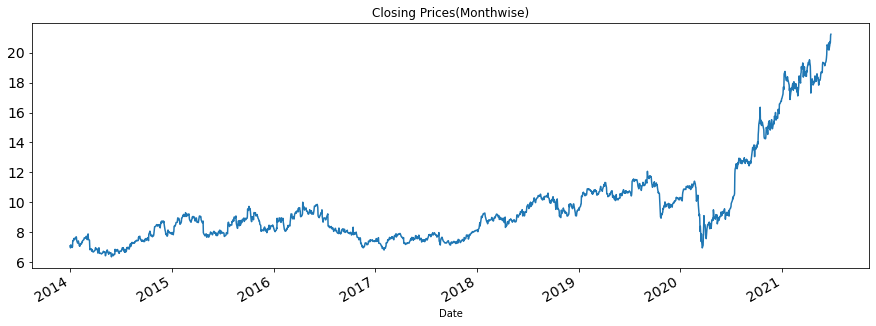

In [8]:
temp=df.groupby(['Date'])['Close'].mean() 
temp.plot(figsize=(15,5), title= 'Closing Prices(Monthwise)', fontsize=14)

In [9]:
fig = px.line(df, x = 'Date',y ='Volume', color = 'Close', title = 'Volume of  price and years')
fig.show()

In [10]:
fig = go.Figure(data=[go.Candlestick(x=df['Date'],
                open=df['Open'], high=df['High'],
                low=df['Low'], close=df['Close'],increasing_line_color= 'midnightblue', decreasing_line_color= 'teal')
                     ])

fig.update_layout(xaxis_rangeslider_visible=False)
fig.show()

In [11]:
def interactive_plot(df,title):
    fig = px.line(title = title)
    for i in df.columns[1:]:
        fig.add_scatter(x = df['Date'], y = df[i], name = i)
    fig.show()

In [12]:
interactive_plot(df,'The Stocks from  years')

# Normalization

The purpose of normalization is to eliminate such anomalies and provide accurate historical information that enables reliable comparisons and forecasting.

In [13]:
def normalization(df):
    x = df.copy()
    for i in x.columns[1:]:
        x[i] = x[i]/x[i][0]
    return x

In [14]:
interactive_plot(normalization(df),'The Stocks after Anomaliess')

In [15]:
normalization(df)

,Date,High,Low,Open,Close,Volume,Adj Close
0,2013-12-31,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,2014-01-02,0.988576,0.980882,0.992063,0.981095,1.259823,0.981095
2,2014-01-03,1.011951,1.007081,1.007937,1.009717,2.912839,1.009717
3,2014-01-06,1.000176,0.994335,1.003351,0.994876,1.667128,0.994876
4,2014-01-07,0.991037,0.985130,0.984303,0.990989,2.144992,0.990989
...,...,...,...,...,...,...,...
1880,2021-06-21,2.887874,2.876261,2.875485,2.901767,1.386137,3.532494
1881,2021-06-22,2.921617,2.890423,2.892416,2.934276,1.935563,3.572069
1882,2021-06-23,2.911775,2.906001,2.899471,2.924382,1.974993,3.560024
1883,2021-06-24,3.015817,3.000885,3.012346,2.995053,2.053473,3.646057


In [16]:
dff = normalization(df)

In [17]:
def daily_return(df):
    df_daily_return = df.copy()
    for i in df.columns[1:]:
        for j in range(1,len(df)):
         # Calculate the percentage of change from the previous day
            df_daily_return[i][j] = ((df[i][j]- df[i][j-1])/df[i][j-1])*100
        df_daily_return[i][0]=0
    return df_daily_return

In [18]:
daily_return(df)

,Date,High,Low,Open,Close,Volume,Adj Close
0,2013-12-31,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,2014-01-02,-1.142358,-1.911846,-0.793652,-1.890459,25.982291,-1.890461
2,2014-01-03,2.364448,2.670997,1.600003,2.917347,131.210191,2.917343
3,2014-01-06,-1.163602,-1.265602,-0.454947,-1.469817,-42.766220,-1.469808
4,2014-01-07,-0.913724,-0.925755,-1.898397,-0.390697,28.663900,-0.390699
...,...,...,...,...,...,...,...
1880,2021-06-21,-0.484489,0.744046,-1.019917,1.684003,-64.917625,1.684003
1881,2021-06-22,1.168451,0.492370,0.588817,1.120309,39.637189,1.120309
1882,2021-06-23,-0.336870,0.538954,0.243899,-0.337185,2.037133,-0.337185
1883,2021-06-24,3.573161,3.265108,3.892950,2.416626,3.973661,2.416626


In [19]:
stocks_daily_return = daily_return(df)
stocks_daily_return

,Date,High,Low,Open,Close,Volume,Adj Close
0,2013-12-31,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,2014-01-02,-1.142358,-1.911846,-0.793652,-1.890459,25.982291,-1.890461
2,2014-01-03,2.364448,2.670997,1.600003,2.917347,131.210191,2.917343
3,2014-01-06,-1.163602,-1.265602,-0.454947,-1.469817,-42.766220,-1.469808
4,2014-01-07,-0.913724,-0.925755,-1.898397,-0.390697,28.663900,-0.390699
...,...,...,...,...,...,...,...
1880,2021-06-21,-0.484489,0.744046,-1.019917,1.684003,-64.917625,1.684003
1881,2021-06-22,1.168451,0.492370,0.588817,1.120309,39.637189,1.120309
1882,2021-06-23,-0.336870,0.538954,0.243899,-0.337185,2.037133,-0.337185
1883,2021-06-24,3.573161,3.265108,3.892950,2.416626,3.973661,2.416626


In [20]:
interactive_plot(daily_return(df),'The Stockson daily returns')

<AxesSubplot:xlabel='Date', ylabel='Close'>

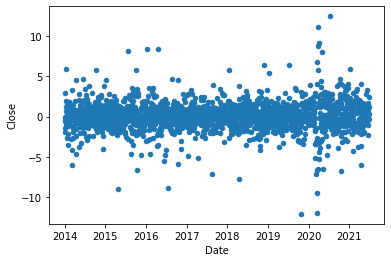

In [21]:
stocks_daily_return.plot(kind = 'scatter', x = 'Date',y = 'Close')

<AxesSubplot:xlabel='Date', ylabel='Volume'>

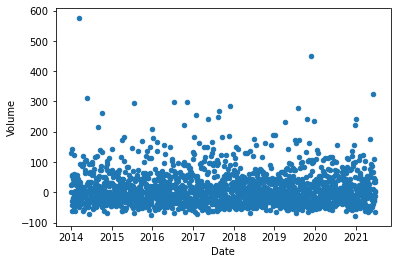

In [22]:
stocks_daily_return.plot(kind = 'scatter', x = 'Date',y = 'Volume')

<AxesSubplot:xlabel='Date', ylabel='High'>

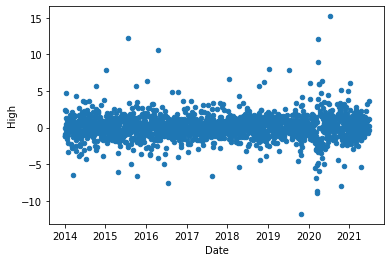

In [23]:
stocks_daily_return.plot(kind = 'scatter', x = 'Date',y = 'High')

<AxesSubplot:xlabel='Date'>

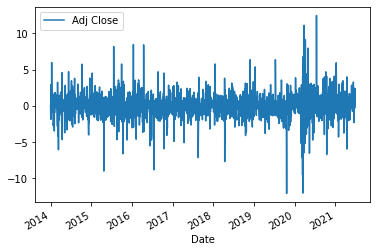

In [24]:
stocks_daily_return.plot(kind = 'line', x = 'Date',y = 'Adj Close')

# MOVING AVAERAGE

The most common applications of moving averages are to identify the trending direction and determine support and resistance levels. ... As the stock price changes, its average price moves up or down. Let's take a look at this indicator and how it can help traders follow trends to make higher profits.

In [25]:
moving_average_df = df.copy()
for i in moving_average_df.columns[1:]:
    moving_average_df[i] = df[i].rolling(21).mean()

In [26]:
fig = go.Figure(data=[go.Candlestick(x=moving_average_df ['Date'],
                open=moving_average_df ['Open'], high=moving_average_df ['High'],
                low=moving_average_df ['Low'], close=moving_average_df ['Close'],increasing_line_color= 'midnightblue', decreasing_line_color= 'teal')
                     ])

fig.update_layout(xaxis_rangeslider_visible=False)
fig.show()

In [27]:
moving_average_df

,Date,High,Low,Open,Close,Volume,Adj Close
0,2013-12-31,NaN,NaN,NaN,NaN,NaN,NaN
1,2014-01-02,NaN,NaN,NaN,NaN,NaN,NaN
2,2014-01-03,NaN,NaN,NaN,NaN,NaN,NaN
3,2014-01-06,NaN,NaN,NaN,NaN,NaN,NaN
4,2014-01-07,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...
1880,2021-06-21,19.754762,19.503333,19.610476,19.643810,6.978010e+06,19.597223
1881,2021-06-22,19.847619,19.584762,19.691429,19.740953,6.937429e+06,19.703570
1882,2021-06-23,19.942857,19.675714,19.781905,19.837143,7.026462e+06,19.808940
1883,2021-06-24,20.062381,19.793809,19.900952,19.954286,6.967652e+06,19.935292


In [28]:
for i in df.columns[1:]:
    fig = px.line(x = df.Date[20:],y = df[i][20:],  title =  i + ' Original Stock Price vs. 21-days Moving Average change')
    fig.add_scatter(x = moving_average_df.Date[20:], y = moving_average_df[i][20:])
    fig.show()

In [29]:
signal = df.copy()
for i in range(len(df)):
    for j in df.columns[1:]:
        if df[j][i]>moving_average_df[j][i]:
            signal[j][i] = 1
        if df[j][i] < moving_average_df[j][i]:
            signal[j][i] = -1
            

In [30]:
signal[21:]

,Date,High,Low,Open,Close,Volume,Adj Close
21,2014-01-31,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
22,2014-02-03,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
23,2014-02-04,-1.0,-1.0,-1.0,-1.0,1.0,-1.0
24,2014-02-05,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
25,2014-02-06,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
...,...,...,...,...,...,...,...
1880,2021-06-21,1.0,1.0,1.0,1.0,-1.0,1.0
1881,2021-06-22,1.0,1.0,1.0,1.0,-1.0,1.0
1882,2021-06-23,1.0,1.0,1.0,1.0,-1.0,1.0
1883,2021-06-24,1.0,1.0,1.0,1.0,-1.0,1.0


In [31]:
company_list = [df]
company_name = ['INFOSYS']

for company, com_name in zip(company_list, company_name):
    company["company_name"] = com_name
    
data = pd.concat(company_list, axis=0)
data.head()

,Date,High,Low,Open,Close,Volume,Adj Close,company_name
0,2013-12-31,7.11250,7.06125,7.08750,7.07500,2891200.0,5.811759,INFOSYS
1,2014-01-02,7.03125,6.92625,7.03125,6.94125,3642400.0,5.701890,INFOSYS
2,2014-01-03,7.19750,7.11125,7.14375,7.14375,8421600.0,5.868233,INFOSYS
3,2014-01-06,7.11375,7.02125,7.11125,7.03875,4820000.0,5.781981,INFOSYS
4,2014-01-07,7.04875,6.95625,6.97625,7.01125,6201600.0,5.759391,INFOSYS


In [32]:
ma_day = [10, 20, 50]

for ma in ma_day:
    for company in company_list:
        column_name = f"MA for {ma} days"
        company[column_name] = company['Adj Close'].rolling(ma).mean()

<AxesSubplot:>

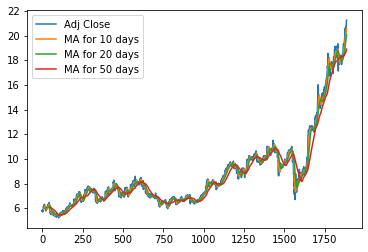

In [33]:
df[['Adj Close', 'MA for 10 days', 'MA for 20 days', 'MA for 50 days']].plot()

C:\Users\HI\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<Figure size 864x864 with 0 Axes>

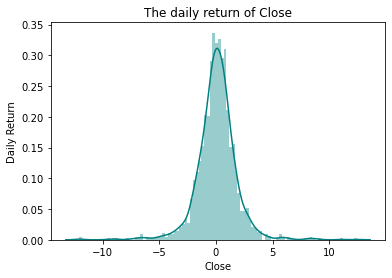

<Figure size 864x864 with 0 Axes>

In [34]:

sns.distplot(stocks_daily_return['Close'].dropna(), bins = 100, color ='Teal')
sns.color_palette("mako")
plt.ylabel('Daily Return')
plt.title('The daily return of Close')
plt.figure(figsize=(12, 12))

C:\Users\HI\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<Figure size 864x864 with 0 Axes>

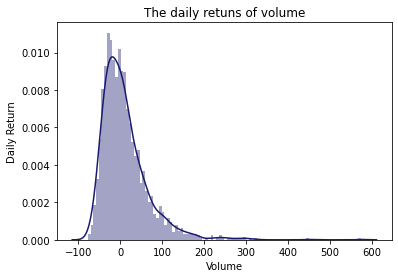

<Figure size 864x864 with 0 Axes>

In [35]:
sns.distplot(stocks_daily_return['Volume'].dropna(), bins = 100, color ='MidnightBlue')
sns.color_palette("rainbow")
plt.ylabel('Daily Return')
plt.title('The daily retuns of volume')
plt.figure(figsize=(12, 12))

C:\Users\HI\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<Figure size 864x864 with 0 Axes>

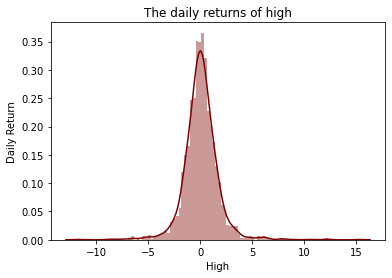

<Figure size 864x864 with 0 Axes>

In [36]:
sns.distplot(stocks_daily_return['High'].dropna(), bins = 100, color ='Maroon')
sns.color_palette("rainbow")
plt.ylabel('Daily Return')
plt.title('The daily returns of high')
plt.figure(figsize=(12, 12))

In [37]:
fig = px.line(df, x='Date', y='Volume',title='STOCKS DURING LOCKDOWN',range_x=['2020-01-01','2022-01-01'])
fig.update_layout(
            shapes=[
                    dict(
                        type="rect",
                        xref="x",
                        yref="paper",
                        x0="2020-03-25", 

                        y0=0,
                        x1="2020-05-31",
                        y1=1,
                        fillcolor="midnightblue",
                        opacity=0.5,
                        layer="below",
                        line_width=0,
                        ),
                    
                # Second phase Lockdown
                dict(
                    type="rect",
                    xref="x",
                    yref="paper",
                    x0="2021-02-10",
                    y0=0,
                    x1="2021-06-20",
                    y1=1,
                    fillcolor="mediumpurple",
                    opacity=0.5,
                    layer="below",
                    line_width=0,)],
              
              
annotations=[dict(x='2020-03-19', y=0.99, xref='x', yref='paper',showarrow=False, xanchor='right', text='Phase 1 '),
             dict(x='2021-01-01', y=0.99, xref='x', yref='paper', showarrow=False, xanchor='right', text='Phase 2 ')
             ])
fig.show()

# Capital Asset Pricing Model (CAPM)

The Capital Asset Pricing Model (CAPM) describes the relationship between systematic risk and expected return for assets, particularly stocks. CAPM is widely used throughout finance for pricing risky securities and generating expected returns for assets given the risk of those assets and cost of capital

#"E(ri) = rf+ βi(rm - rf)" is the formulae for CAPM

In [38]:
#ri = Expected_return_Security
#rf = riskfree rate of return
#β  = β between stock and market
#rm = risk premium (incentive for investing in a risk security)

In [39]:
#Applying CAPM MODEL

In [40]:
#lets assume 
beta = 1.11

In [41]:
stocks_daily_return['Adj Close'].mean()

0.08436545441082705

In [42]:
rm = stocks_daily_return['Adj Close'].mean()*252

In [43]:
# Assume risk free rate is zero
# Also you can use the yield of a 10-years U.S. Government bond as a risk free rate
rf = 0 

# Calculate return for any security (APPL) using CAPM  
Expected_return_Security = rf + ( beta * (rm-rf) ) 

In [44]:
Expected_return_Security

23.59870490779654

# PORTFOLIO ALLOCATION

It aims to maximize returns by investing in different areas that would each react differently to the same event

A portfolio investment may be either strategic—where you buy financial assets with the intention of holding onto those assets for a long time; or tactical—where you actively buy and sell the asset hoping to achieve short-term gains.

In [45]:
# Let's create random portfolio weights
# Portfolio weights must sum to 1 
np.random.seed()
weights = np.array(np.random.random(6))

In [46]:
weights = weights/np.sum(weights)

In [47]:
weights

array([0.31028717, 0.31538553, 0.06896461, 0.05119747, 0.05799746,
       0.19616776])

In [48]:
df_portfolio = dff

In [49]:
df_portfolio

,Date,High,Low,Open,Close,Volume,Adj Close
0,2013-12-31,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,2014-01-02,0.988576,0.980882,0.992063,0.981095,1.259823,0.981095
2,2014-01-03,1.011951,1.007081,1.007937,1.009717,2.912839,1.009717
3,2014-01-06,1.000176,0.994335,1.003351,0.994876,1.667128,0.994876
4,2014-01-07,0.991037,0.985130,0.984303,0.990989,2.144992,0.990989
...,...,...,...,...,...,...,...
1880,2021-06-21,2.887874,2.876261,2.875485,2.901767,1.386137,3.532494
1881,2021-06-22,2.921617,2.890423,2.892416,2.934276,1.935563,3.572069
1882,2021-06-23,2.911775,2.906001,2.899471,2.924382,1.974993,3.560024
1883,2021-06-24,3.015817,3.000885,3.012346,2.995053,2.053473,3.646057


In [50]:
df_portfolio.columns[1:]

Index(['High', 'Low', 'Open', 'Close', 'Volume', 'Adj Close'], dtype='object')

In [51]:
for i,stock  in enumerate(df_portfolio.columns[1:]):
    df_portfolio[stock] = df_portfolio[stock]* weights[i]
    df_portfolio[stock] = df_portfolio[stock] * 1000000

In [52]:
df_portfolio[stock]

0       196167.758376
1       192459.284250
2       198073.982191
3       195162.675812
4       194400.176629
            ...      
1880    692961.381918
1881    700724.693915
1882    698361.952384
1883    715238.751184
1884    717263.949014
Name: Adj Close, Length: 1885, dtype: float64

In [53]:
df_portfolio['Portfolio in rupess'] = df_portfolio[df_portfolio[stock] != 'Date'].sum(axis =1)

In [54]:
df_portfolio

,Date,High,Low,Open,Close,Volume,Adj Close,Portfolio in rupess
0,2013-12-31,310287.174769,315385.531371,68964.605867,51197.465990,57997.463626,196167.758376,1.000000e+06
1,2014-01-02,306742.585461,309355.845741,68417.266805,50229.598950,73066.533451,192459.284250,1.000271e+06
2,2014-01-03,313995.353467,317618.731706,69511.944930,51694.970642,168937.271609,198073.982191,1.119832e+06
3,2014-01-06,310341.697631,313598.941286,69195.702520,50935.149433,96689.186040,195162.675812,1.035923e+06
4,2014-01-07,307506.030345,310695.782980,67882.093410,50736.147572,124404.078039,194400.176629,1.055624e+06
...,...,...,...,...,...,...,...,...
1880,2021-06-21,896070.113592,907131.142983,198306.679476,148563.115231,80392.444393,692961.381918,2.923425e+06
1881,2021-06-22,906540.250524,911597.586249,199474.342329,150227.481883,112257.749792,700724.693915,2.980822e+06
1882,2021-06-23,903486.387778,916510.682360,199960.857691,149720.936711,114544.589462,698361.952384,2.982585e+06
1883,2021-06-24,935769.413996,946435.741493,207745.233405,153339.132285,119096.202805,715238.751184,3.077624e+06


In [55]:
#Portfolio in rupees in daily_returns

In [56]:
df_portfolio['daily_returns'] = 0.000

In [57]:
for i in range(1,len(df_portfolio)):
    df_portfolio['daily_returns'][i] = ((df_portfolio['Portfolio in rupess'][i]-df_portfolio['Portfolio in rupess'][i-1])/df_portfolio['Portfolio in rupess'][i-1])*100

In [58]:
df_portfolio 

,Date,High,Low,Open,Close,Volume,Adj Close,Portfolio in rupess,daily_returns
0,2013-12-31,310287.174769,315385.531371,68964.605867,51197.465990,57997.463626,196167.758376,1.000000e+06,0.000000
1,2014-01-02,306742.585461,309355.845741,68417.266805,50229.598950,73066.533451,192459.284250,1.000271e+06,0.027111
2,2014-01-03,313995.353467,317618.731706,69511.944930,51694.970642,168937.271609,198073.982191,1.119832e+06,11.952873
3,2014-01-06,310341.697631,313598.941286,69195.702520,50935.149433,96689.186040,195162.675812,1.035923e+06,-7.492988
4,2014-01-07,307506.030345,310695.782980,67882.093410,50736.147572,124404.078039,194400.176629,1.055624e+06,1.901777
...,...,...,...,...,...,...,...,...,...
1880,2021-06-21,896070.113592,907131.142983,198306.679476,148563.115231,80392.444393,692961.381918,2.923425e+06,-4.399364
1881,2021-06-22,906540.250524,911597.586249,199474.342329,150227.481883,112257.749792,700724.693915,2.980822e+06,1.963356
1882,2021-06-23,903486.387778,916510.682360,199960.857691,149720.936711,114544.589462,698361.952384,2.982585e+06,0.059155
1883,2021-06-24,935769.413996,946435.741493,207745.233405,153339.132285,119096.202805,715238.751184,3.077624e+06,3.186466


In [59]:
interactive_plot(df_portfolio, title = 'Portfolio in TillDate' )

# SHARPE RATIO

the ratio is the average return earned in excess of the risk-free rate per unit of volatility or total risk.

The Formula for the Sharpe Ratio Is

In [60]:
sharpe_ratio = ((df_portfolio['daily_returns'].mean()-rf)/df_portfolio['daily_returns'].std())* np.sqrt(252)

In [61]:
sharpe_ratio

0.7457774327847371

In [62]:
rol_mean = df['Close'].rolling(window = 12, center = False).mean()
rol_std = df['Close'].rolling(window = 12, center = False).std()



Text(0.5, 1.0, 'Rolling Mean & Standard Deviation')

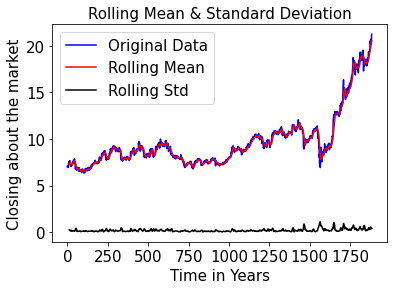

In [63]:
plt.plot(figsize =(150,30))
plt.plot(df['Close'], color = 'blue',label = 'Original Data')
plt.plot(rol_mean, color = 'red', label = 'Rolling Mean')
plt.plot(rol_std, color ='black', label = 'Rolling Std')
plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)
plt.xlabel('Time in Years', fontsize = 15)
plt.ylabel('Closing about the market', fontsize = 15)
plt.legend(loc='best', fontsize = 15)
plt.title('Rolling Mean & Standard Deviation', fontsize = 15)

In [64]:

from statsmodels.graphics.tsaplots import plot_acf,plot_pacf
from statsmodels.tsa.stattools import adfuller
from pmdarima import auto_arima

In [65]:
# Ho: Non-Stationary
#H1 Stationary

In [66]:
def adfuller_test(close):
    result=adfuller(close)
    labels = ['ADF Test Statistic','p-value','#Lags Used','Number of Observations Used']
    for value,label in zip(result,labels):
        print(label+' : '+str(value) )
    if result[1] <= 0.05:
        print("strong evidence against the null hypothesis(Ho), reject the null hypothesis. Indicating it is stationary")
    else:
        print("weak evidence against null hypothesis, time series has a unit root, indicating it is non-stationary ")
    

In [67]:
adfuller_test(df['Close'])

ADF Test Statistic : 1.7632494924437616
p-value : 0.9982732741743376
#Lags Used : 10
Number of Observations Used : 1874
weak evidence against null hypothesis, time series has a unit root, indicating it is non-stationary 


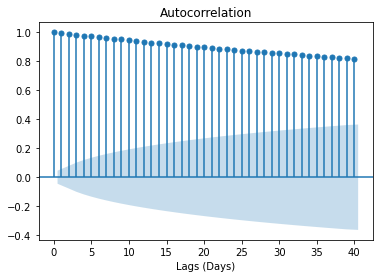

In [68]:
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf
plot_acf(df['Close'].iloc[13:],lags=40)
plt.xlabel('Lags (Days)')
plt.show()

In [69]:
df['Close of first difference'] = df['Close'] - df['Close'].shift(1)

In [70]:
adfuller_test(df['Close of first difference'].dropna())

ADF Test Statistic : -13.72282546912269
p-value : 1.1790823149127041e-25
#Lags Used : 9
Number of Observations Used : 1874
strong evidence against the null hypothesis(Ho), reject the null hypothesis. Indicating it is stationary


<AxesSubplot:>

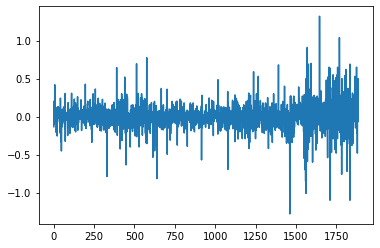

In [71]:
df['Close of first difference'].plot()

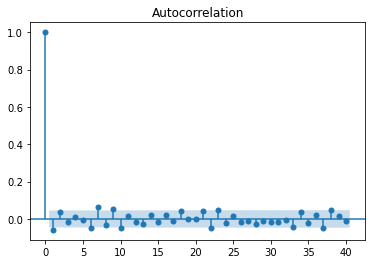

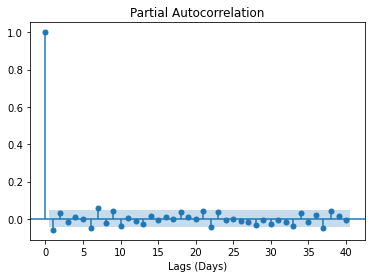

In [72]:
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf
plot_acf(df['Close of first difference'].iloc[13:],lags=40)
plot_pacf(df['Close of first difference'].iloc[13:],lags=40)
plt.xlabel('Lags (Days)')
plt.show()

In [73]:
train = df[df.Date < '2020']
test = df[df.Date > '2020']

In [74]:
model = auto_arima(train['Close'],order= (4,2,0))


C:\Users\HI\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



In [75]:
model_fit = model.fit(train['Close'])

In [76]:
model_fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                 1511
Model:               SARIMAX(0, 1, 0)   Log Likelihood                 867.238
Date:                Mon, 28 Jun 2021   AIC                          -1732.477
Time:                        15:07:26   BIC                          -1727.157
Sample:                             0   HQIC                         -1730.496
                               - 1511                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2         0.0186      0.000     66.824      0.000       0.018       0.019
===================================================================================
Ljung-Box (L1) (Q):                   1.15   Jarque-Bera (JB):              6279.69
Prob(Q):                              0.28   Prob(JB):                         0.00
Heteroskedasticity (H):               1.37   Skew:                            -0.74
Prob(H) (two-sided):                  0.00   Kurtosis:                        12.88
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [77]:
test['Prediction']=model.predict(n_periods=len(test))


<AxesSubplot:>

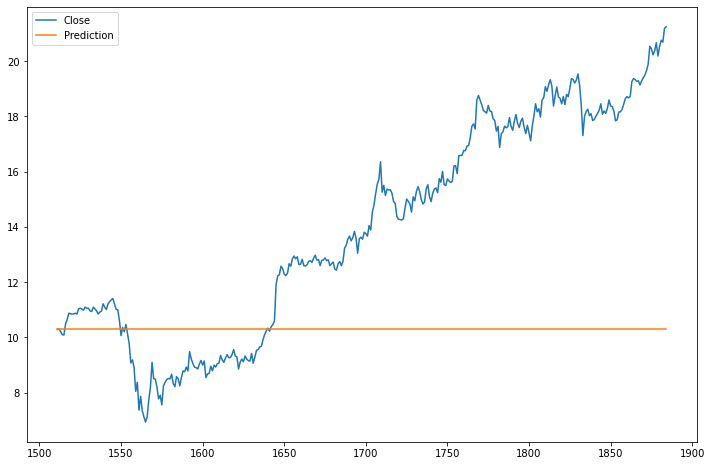

In [78]:
test[['Close','Prediction']].plot(figsize=(12,8))

In [79]:
from sklearn.metrics import mean_absolute_error, mean_squared_error

In [80]:
print('MAE :', mean_absolute_error(test.Close,test.Prediction))
print('RMSE :', np.sqrt(mean_absolute_error(test.Close,test.Prediction)))

MAE : 4.296096437117633
RMSE : 2.0727026890313125


In [81]:
# Forecasting the Next Year Stocks

In [82]:
from fbprophet import Prophet
from sklearn.metrics import mean_absolute_error, mean_squared_error
from fbprophet.diagnostics import cross_validation
from fbprophet.diagnostics import performance_metrics
from fbprophet.plot import plot_cross_validation_metric

In [83]:
fmodel = Prophet()
fmodel.fit(df[['Date','Close']].rename(columns = {"Date":'ds','Close':"y"}))
df_future = fmodel.make_future_dataframe(periods=365)


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [84]:
df_future.tail()

,ds
2245,2022-06-21
2246,2022-06-22
2247,2022-06-23
2248,2022-06-24
2249,2022-06-25


In [85]:
df_prd = fmodel.predict(df_future)

In [86]:
df_prd

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2013-12-31,6.642443,5.914947,7.735947,6.642443,6.642443,0.160034,0.160034,0.160034,-0.081935,-0.081935,-0.081935,0.241969,0.241969,0.241969,0.0,0.0,0.0,6.802478
1,2014-01-02,6.650726,6.061520,7.720922,6.650726,6.650726,0.226817,0.226817,0.226817,-0.070545,-0.070545,-0.070545,0.297363,0.297363,0.297363,0.0,0.0,0.0,6.877543
2,2014-01-03,6.654867,6.011452,7.781350,6.654867,6.654867,0.260692,0.260692,0.260692,-0.067255,-0.067255,-0.067255,0.327947,0.327947,0.327947,0.0,0.0,0.0,6.915559
3,2014-01-06,6.667291,6.123022,7.910651,6.667291,6.667291,0.340885,0.340885,0.340885,-0.086756,-0.086756,-0.086756,0.427641,0.427641,0.427641,0.0,0.0,0.0,7.008175
4,2014-01-07,6.671432,6.153422,7.907302,6.671432,6.671432,0.380319,0.380319,0.380319,-0.081935,-0.081935,-0.081935,0.462254,0.462254,0.462254,0.0,0.0,0.0,7.051751
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2245,2022-06-21,27.778681,24.179909,30.146477,24.730726,30.651538,-0.526659,-0.526659,-0.526659,-0.081935,-0.081935,-0.081935,-0.444724,-0.444724,-0.444724,0.0,0.0,0.0,27.252022
2246,2022-06-22,27.800231,24.174300,30.121854,24.740121,30.703582,-0.543873,-0.543873,-0.543873,-0.084866,-0.084866,-0.084866,-0.459007,-0.459007,-0.459007,0.0,0.0,0.0,27.256358
2247,2022-06-23,27.821781,24.073907,30.243654,24.749390,30.753661,-0.544295,-0.544295,-0.544295,-0.070545,-0.070545,-0.070545,-0.473750,-0.473750,-0.473750,0.0,0.0,0.0,27.277486
2248,2022-06-24,27.843330,24.207295,30.303363,24.762802,30.808258,-0.555780,-0.555780,-0.555780,-0.067255,-0.067255,-0.067255,-0.488525,-0.488525,-0.488525,0.0,0.0,0.0,27.287550


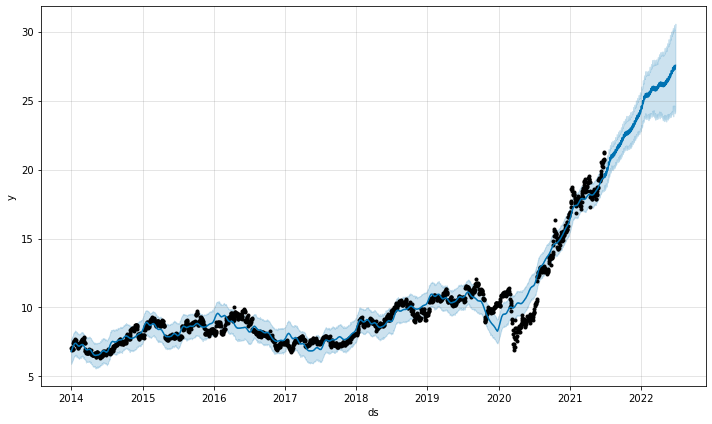

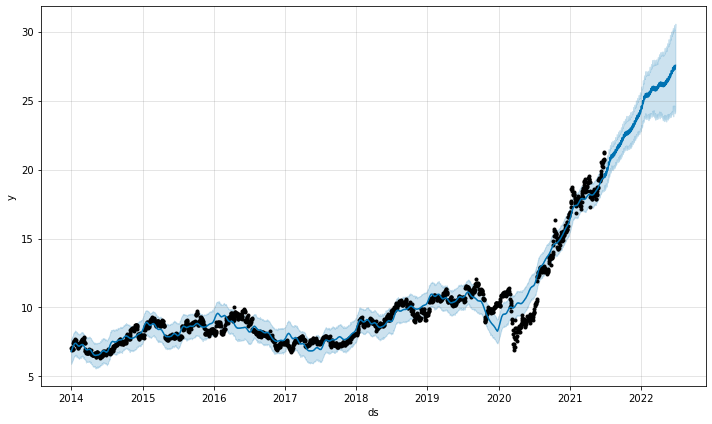

In [87]:
fmodel.plot(df_prd)

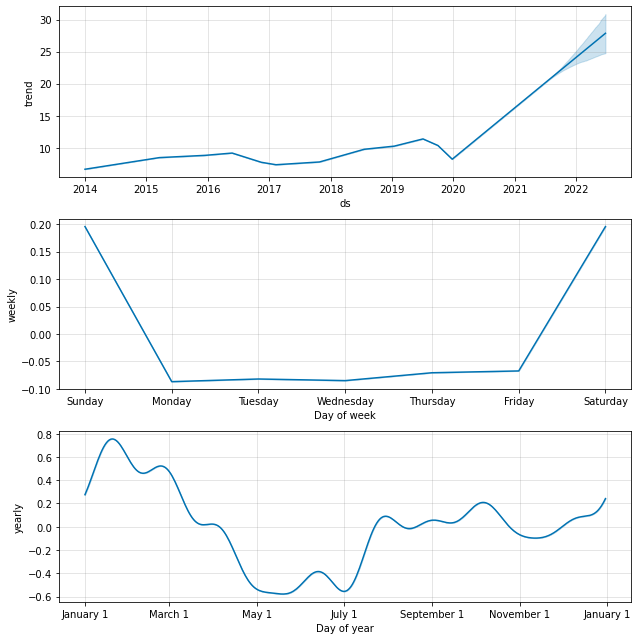

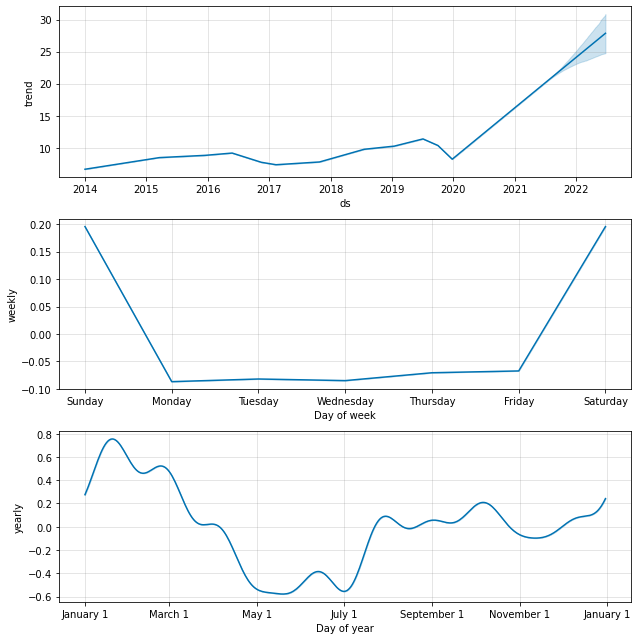

In [88]:
fmodel.plot_components(df_prd)